**Project 4 Instructions**

1. Read about human cough types - dry and wet, volunatry/ involuntary, etc. (reference: https://ieeexplore.ieee.org/document/9175986). Why cough is an important biomarker for respiratory disease? Do cough frequency vary with disease severity?
2. Select a sound classification dataset containing cough/ lungs/ heart sound e.g. ESC-50 dataset https://github.com/karolpiczak/ESC-50
3. Make a new dataset with human cough sounds in one class and 4 other types of sounds e.g. sneezing, door knocking, raining, dog barking etc. in another class
4. Listen to the sounds and visualize some instances/ spectogram using the software Audacity https://www.audacityteam.org/
5. label the target class audio records as cough and the other class audio records as not cough (reference: https://www.researchgate.net/publication/336011335_Efficient_Online_Cough_Detection_with_a_Minimal_Feature_Set_Using_Smartphones_for_Automated_Assessment_of_Pulmonary_Patients
6. split your dataset into train and test set
7. develop a cough classification model using the training set and evaluate the model performance on test set
8. Retrain another model using the same dataset with Teachable Machine Platform
9. Export the model and evaluate it in python on the test data and compare your model performance with that of teachable machine
10. push your code to project-4 branch of the course Github and make a pull request.

**References**

https://dolby.io/blog/beginners-guide-to-visualizing-audio-as-a-spectogram-in-python/

https://github.com/karolpiczak/ESC-50#results

https://towardsdatascience.com/how-to-apply-machine-learning-and-deep-learning-methods-to-audio-analysis-615e286fcbbc

**About the Dataset**

The ESC-50 dataset is a labeled collection of 2000 environmental audio recordings suitable for benchmarking methods of environmental sound classification.

The dataset consists of 5-second-long recordings organized into 50 semantical classes (with 40 examples per class)

The dataset has been prearranged into 5 folds for comparable cross-validation, making sure that fragments from the same original source file are contained in a single fold.

For the purpose of this project, we will be using samples from 5 classes which will include Human Cough sound as the main class

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# librosa is a python package for music and audio analysis. It provides the building blocks necessary to create music information retrieval systems.
!pip install librosa

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# Importing all necessary libraries
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import wave
import soundfile as sf
import os
import glob
import librosa
import IPython.display as ipd
import librosa.display
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv1D, GlobalAveragePooling1D, MaxPooling1D
from keras.models import load_model

**Visualizing some sample audio files in python as well as Audacity to understand the different patterns**

In [ ]:
dog_sound_takeA='/content/drive/MyDrive/ESC-50-master/audio/2-122104-A-0.wav'
dog_sound_takeB='/content/drive/MyDrive/ESC-50-master/audio/2-122104-B-0.wav'

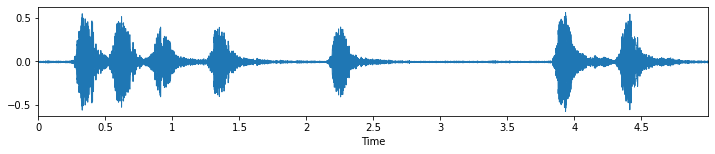

In [ ]:
### Visualising the Dog Sound
plt.figure(figsize=(12,2))
data,sample_rate=librosa.load(dog_sound_takeA,sr=None)
librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(dog_sound_takeA)

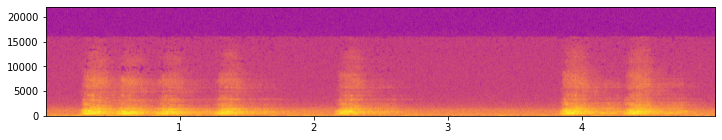

In [ ]:
from scipy.io import wavfile
plt.figure(figsize=(12, 2))
Fs1, aud1 = wavfile.read(dog_sound_takeA)
powerSpectrum, frequenciesFound, time, imageAxis = plt.specgram(aud1, Fs=Fs1,cmap='plasma')
plt.show()

Spectrogram obtained from Audacity for comparison

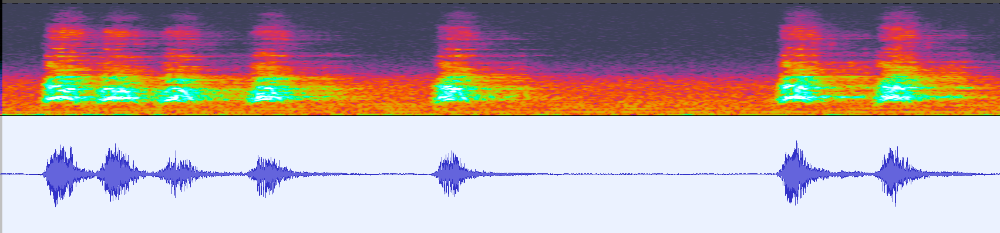

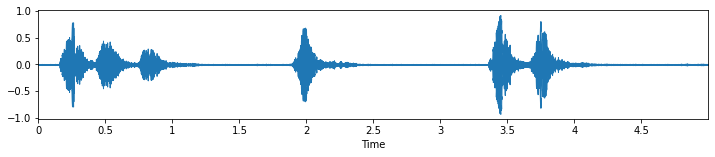

In [ ]:
# Dog sound for take B
plt.figure(figsize=(12,2))
data1,sample_rate1=librosa.load(dog_sound_takeB,sr=None)
librosa.display.waveplot(data1,sr=sample_rate1)
ipd.Audio(dog_sound_takeB)

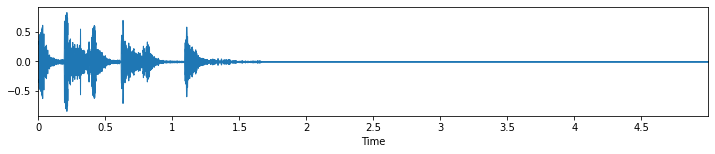

In [ ]:
# Human Cough Sound
cough_sound='/content/drive/MyDrive/ESC-50-master/audio/1-30830-A-24.wav'
plt.figure(figsize=(12,2))
data2,sample_rate2=librosa.load(cough_sound,sr=None)
librosa.display.waveplot(data2,sr=sample_rate2)
ipd.Audio(cough_sound)

/usr/local/lib/python3.7/dist-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


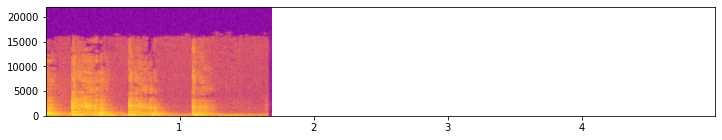

In [ ]:
plt.figure(figsize=(12, 2))
Fs2, aud2 = wavfile.read(cough_sound)
powerSpectrum, frequenciesFound, time, imageAxis = plt.specgram(aud2, Fs=Fs2,cmap='plasma')
plt.show()

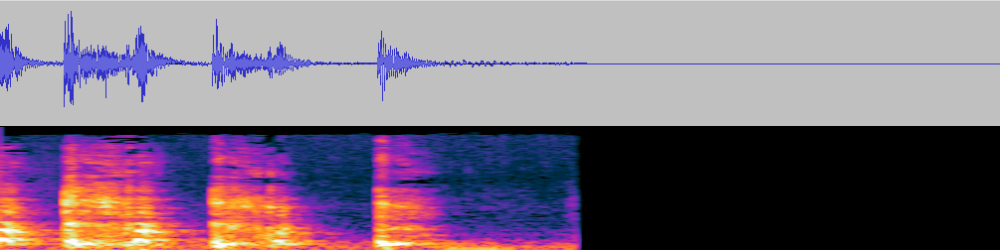

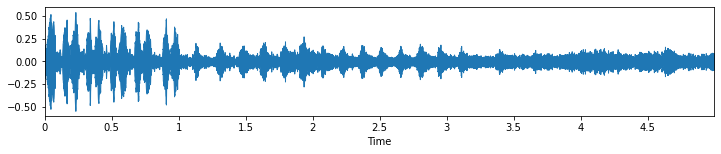

In [ ]:
### Bird Sound
bird_sound='/content/drive/MyDrive/ESC-50-master/audio/1-100038-A-14.wav'
plt.figure(figsize=(12,2))
data3,sample_rate3=librosa.load(bird_sound, sr=None)
librosa.display.waveplot(data3,sr=sample_rate3)
ipd.Audio(bird_sound)

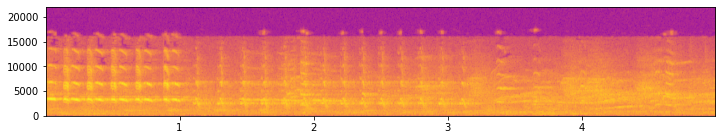

In [ ]:
plt.figure(figsize=(12, 2))
Fs3, aud3 = wavfile.read(bird_sound)
powerSpectrum, frequenciesFound, time, imageAxis = plt.specgram(aud3, Fs=Fs3,cmap='plasma')
plt.show()

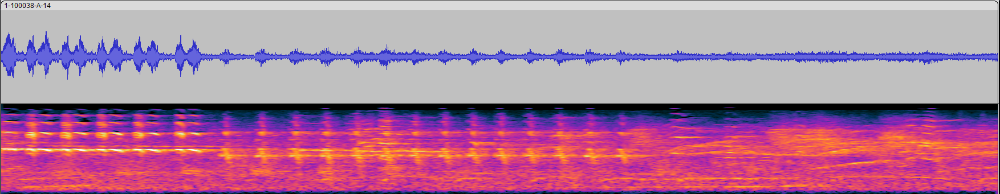

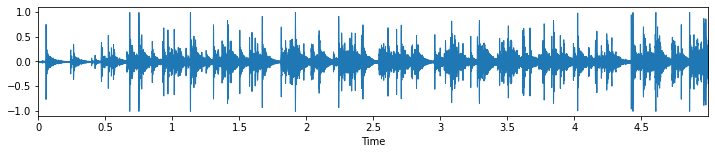

In [ ]:
### Clapping Sound
clap_sound='/content/drive/MyDrive/ESC-50-master/audio/1-104089-A-22.wav'
plt.figure(figsize=(12,2))
data4,sample_rate4=librosa.load(clap_sound, sr=None)
librosa.display.waveplot(data4,sr=sample_rate4)
ipd.Audio(clap_sound)

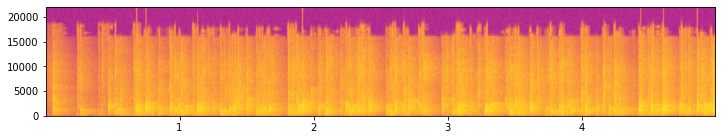

In [ ]:
plt.figure(figsize=(12, 2))
Fs4, aud4 = wavfile.read(clap_sound)
powerSpectrum, frequenciesFound, time, imageAxis = plt.specgram(aud4, Fs=Fs4,cmap='plasma')
plt.show()

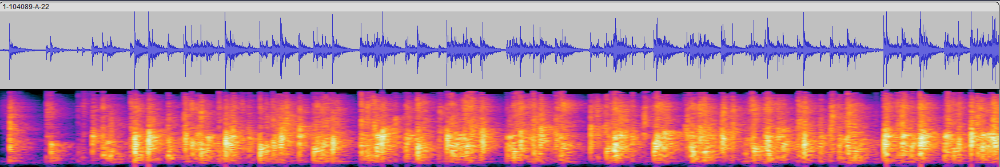

In [ ]:
# Checking sampling Rate for all the above files
print(sample_rate)
print(sample_rate1)
print(sample_rate2)
print(sample_rate3)
print(sample_rate4)

44100
44100
44100
44100
44100


In [ ]:
# printing the data for the above audio files
print(data)
print(data1)
print(data2)
print(data3)
print(data4)

[ 4.2724609e-04  6.7138672e-04  7.9345703e-04 ... -3.0517578e-04
 -3.0517578e-04 -6.1035156e-05]
[-0.00192261 -0.00286865 -0.00341797 ...  0.0017395   0.00213623
  0.0015564 ]
[0.30639648 0.29910278 0.2868042  ... 0.         0.         0.        ]
[-0.01184082 -0.10336304 -0.14141846 ...  0.06985474  0.04049683
  0.00274658]
[-6.1035156e-05 -6.1035156e-05  6.1035156e-05 ... -1.9592285e-01
 -1.7294312e-01 -9.9822998e-02]


**Extract Features**

The mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10-20) which concisely describe the overall shape of a spectral envelope.The MFCC summarises the frequency distribution across the window size, so it is possible to analyse both the frequency and time characteristics of the sound. These audio representations will allow us to identify features for classification.

In [ ]:
# Calculating mfcc for the first audio file (dog_bark)
mfccs = librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=12)
print(mfccs.shape)

(12, 431)


In [ ]:
mfccs

array([[-4.84356476e+02, -4.76321960e+02, -4.76138794e+02, ...,
        -4.66357025e+02, -4.70147888e+02, -4.76664490e+02],
       [ 1.01779762e+02,  1.11118935e+02,  1.12309601e+02, ...,
         1.22395233e+02,  1.18761703e+02,  1.11915222e+02],
       [ 4.95965042e+01,  5.40656471e+01,  5.73135338e+01, ...,
         5.97472382e+01,  5.95852699e+01,  5.80500946e+01],
       ...,
       [ 8.77785110e+00,  1.07489586e+01,  5.11205864e+00, ...,
        -2.62247562e-01,  2.96194434e-01,  1.46826553e+00],
       [ 1.42181635e+00,  2.94948316e+00,  2.20690942e+00, ...,
        -6.97660255e+00, -4.39333725e+00, -6.36022663e+00],
       [ 6.66051567e-01, -1.05789983e+00,  1.21670687e+00, ...,
        -8.70623684e+00, -5.53874397e+00, -9.69712353e+00]], dtype=float32)

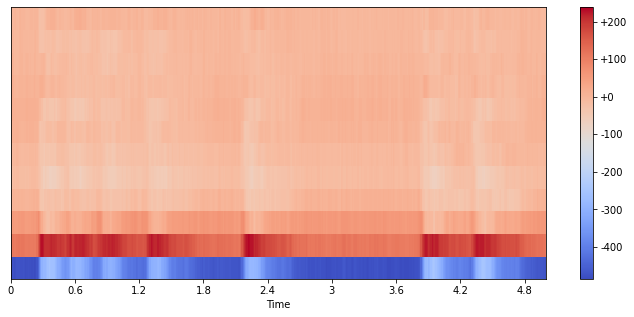

In [ ]:
# Visualizing the mfcc
plt.figure(figsize=(12, 5))
librosa.display.specshow(mfccs, 
                         x_axis="time", 
                         sr=sample_rate)
plt.colorbar(format="%+2.f")
plt.show()

**Defining the paths for the Audio files and the Metadata csv file in order to perform the Feature extraction**

In [ ]:
audio_files='/content/drive/MyDrive/ESC-50-master/audio/'
metadata=pd.read_csv('/content/drive/MyDrive/ESC-50-master/meta/esc50.csv')
metadata.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [ ]:
metadata.info

<bound method DataFrame.info of                filename  fold  target        category  esc10  src_file take
0      1-100032-A-0.wav     1       0             dog   True    100032    A
1     1-100038-A-14.wav     1      14  chirping_birds  False    100038    A
2     1-100210-A-36.wav     1      36  vacuum_cleaner  False    100210    A
3     1-100210-B-36.wav     1      36  vacuum_cleaner  False    100210    B
4     1-101296-A-19.wav     1      19    thunderstorm  False    101296    A
...                 ...   ...     ...             ...    ...       ...  ...
1995   5-263831-B-6.wav     5       6             hen  False    263831    B
1996  5-263902-A-36.wav     5      36  vacuum_cleaner  False    263902    A
1997   5-51149-A-25.wav     5      25       footsteps  False     51149    A
1998    5-61635-A-8.wav     5       8           sheep  False     61635    A
1999     5-9032-A-0.wav     5       0             dog   True      9032    A

[2000 rows x 7 columns]>

For the purpose of this project, we will be using the Human Cough audio files along with 4 other types of audio namely 'Dog bark', 'door knock' , 'Clapping' and 'rain'.

In [ ]:
# Creating another dataframe for the metadata to hold only the audio file categories that we will need for our analysis (200 records)
metadata_new1 = metadata['target'].isin(['24', '30', '10','0','22'])
metadata_new = metadata[metadata_new1]
metadata_new

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
6,1-101336-A-30.wav,1,30,door_wood_knock,False,101336,A
9,1-103995-A-30.wav,1,30,door_wood_knock,False,103995,A
10,1-103999-A-30.wav,1,30,door_wood_knock,False,103999,A
11,1-104089-A-22.wav,1,22,clapping,False,104089,A
...,...,...,...,...,...,...,...
1949,5-251489-A-24.wav,5,24,coughing,False,251489,A
1965,5-254160-A-22.wav,5,22,clapping,False,254160,A
1969,5-256512-A-30.wav,5,30,door_wood_knock,False,256512,A
1988,5-262957-A-22.wav,5,22,clapping,False,262957,A


In [ ]:
metadata_new['category'].value_counts()

coughing           40
rain               40
door_wood_knock    40
clapping           40
dog                40
Name: category, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


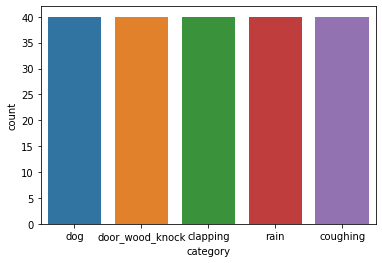

In [ ]:
# Fiding the distribution of data amoung the different categories
sns.countplot(metadata_new['category'])

**Feature Extraction**

In [ ]:
def extract_features(file_name):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=20)
    mfccs_scaled_features = np.mean(mfccs_features.T,axis=0)    
    return mfccs_scaled_features

In [ ]:
import numpy as np
from tqdm import tqdm  #  Instantly make your loops show a smart progress meter
# Now we iterate through every audio file in the metadata and extract features for each audio file
extracted_features=[]
for i,row in tqdm(metadata_new.iterrows()):
    file_name = os.path.join(os.path.abspath(audio_files),str(row["filename"]))
    class_name=row["category"]
    data=extract_features(file_name)
    extracted_features.append([data,class_name])

200it [01:22,  2.42it/s]


In [ ]:
# converting extracted_features to Pandas dataframe
extracted_features_df=pd.DataFrame(extracted_features,columns=['feature','class'])
extracted_features_df.head()

,feature,class
0,"[-601.3449, 5.261408, -9.065388, -3.7297595, -...",dog
1,"[-435.18063, 105.92404, 13.725261, 19.623205, ...",door_wood_knock
2,"[-569.14136, 40.56101, 5.5717382, 4.1844625, 4...",door_wood_knock
3,"[-641.6269, 39.85432, 3.6132596, 1.085563, 4.6...",door_wood_knock
4,"[-94.37435, 46.090195, -62.937862, -19.831861,...",clapping


In [ ]:
extracted_features_df.info

<bound method DataFrame.info of                                                feature            class
0    [-601.3449, 5.261408, -9.065388, -3.7297595, -...              dog
1    [-435.18063, 105.92404, 13.725261, 19.623205, ...  door_wood_knock
2    [-569.14136, 40.56101, 5.5717382, 4.1844625, 4...  door_wood_knock
3    [-641.6269, 39.85432, 3.6132596, 1.085563, 4.6...  door_wood_knock
4    [-94.37435, 46.090195, -62.937862, -19.831861,...         clapping
..                                                 ...              ...
195  [-539.41785, 10.603877, -5.7209377, -2.6727505...         coughing
196  [-108.31487, 92.712074, -77.007324, -6.274603,...         clapping
197  [-342.70023, 80.49286, 29.488073, 16.774641, 9...  door_wood_knock
198  [23.482824, 64.21875, -80.27919, 14.928092, -3...         clapping
199  [-492.40805, 7.3576384, -32.124672, 10.470766,...              dog

[200 rows x 2 columns]>

**Here we are going to have the Cough as one class and all others as 'Not Cough' class**

In [ ]:
extracted_features_df.loc[extracted_features_df['class'].isin(['dog','door_wood_knock','rain','clapping']),'class'] = 'Not Cough'

In [ ]:
extracted_features_df.loc[extracted_features_df['class'].isin(['coughing']),'class'] = 'Cough'

In [ ]:
extracted_features_df

,feature,class
0,"[-601.3449, 5.261408, -9.065388, -3.7297595, -...",Not Cough
1,"[-435.18063, 105.92404, 13.725261, 19.623205, ...",Not Cough
2,"[-569.14136, 40.56101, 5.5717382, 4.1844625, 4...",Not Cough
3,"[-641.6269, 39.85432, 3.6132596, 1.085563, 4.6...",Not Cough
4,"[-94.37435, 46.090195, -62.937862, -19.831861,...",Not Cough
...,...,...
195,"[-539.41785, 10.603877, -5.7209377, -2.6727505...",Cough
196,"[-108.31487, 92.712074, -77.007324, -6.274603,...",Not Cough
197,"[-342.70023, 80.49286, 29.488073, 16.774641, 9...",Not Cough
198,"[23.482824, 64.21875, -80.27919, 14.928092, -3...",Not Cough


In [ ]:
extracted_features_df['Label']=""

In [ ]:
extracted_features_df.loc[extracted_features_df['class'] == 'Cough' , 'Label'] = '0'
extracted_features_df.loc[extracted_features_df['class'] == 'Not Cough' , 'Label'] = '1'

In [ ]:
### Check whether the dataset is imbalanced
extracted_features_df['Label'].value_counts()

1    160
0     40
Name: Label, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


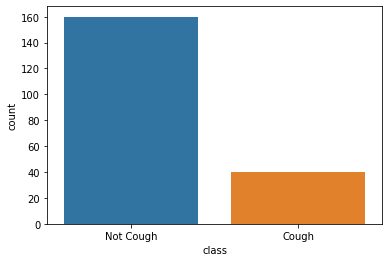

In [ ]:
# Fiding the distribution of data amoung the different categories
sns.countplot(extracted_features_df['class'])

**Writing the Human Cough files into a seperate folder, so they can be easily uploaded into the Teachable Machine application**

In [ ]:
zero = []
path = "/content/drive/MyDrive/ESC-50-master/Human_cough/"
path1='/content/drive/MyDrive/ESC-50-master/audio/'
files = os.listdir(path1)

for fl in glob.glob(os.path.join(path1, '*-24.wav')):
    samplerate, data = wavfile.read(fl)
    zero.append(fl)

In [ ]:
zero

['/content/drive/MyDrive/ESC-50-master/audio/3-145487-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/3-151212-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/3-146873-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-155650-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-152995-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-154443-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-155650-B-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-157296-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-171396-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-169726-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/4-177835-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/5-178997-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/5-184871-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/5-204604-A-24.wav',
 '/content/drive/MyDrive/ESC-50-master/audio/5-207681-A-24.wav',
 '/content/drive/MyDrive/

In [ ]:
import shutil, os
human_files = zero
for f in human_files:
    shutil.copy(f, '/content/drive/MyDrive/ESC-50-master/Human_cough/')

Writing the Other files(Dog bark, Door knock, clapping and Rain) files into a seperate folder, so they can be easily uploaded into the Teachable Machine application

In [ ]:
zero1 = []
path = "/content/drive/MyDrive/ESC-50-master/Dog_bark/"
path1='/content/drive/MyDrive/ESC-50-master/audio'
files = os.listdir(path1)

for fl2 in glob.glob(os.path.join(path1, '*-0.wav')):
    samplerate, data = wavfile.read(fl2)
    zero1.append(fl2)

In [ ]:
dog_files = zero1
for f in dog_files:
    shutil.copy(f, '/content/drive/MyDrive/ESC-50-master/Dog_bark/')

In [ ]:
len(zero1)

40

In [ ]:
zero2 = []
path = "/content/drive/MyDrive/ESC-50-master/Door_knock/"
path1='/content/drive/MyDrive/ESC-50-master/audio/'
files = os.listdir(path1)

for fl3 in glob.glob(os.path.join(path1, '*-30.wav')):
    samplerate, data = wavfile.read(fl3)
    zero2.append(fl3)

In [ ]:
door_knock_files = zero2
for f in door_knock_files:
    shutil.copy(f, "/content/drive/MyDrive/ESC-50-master/Door_knock/")

len(zero2)

In [ ]:
zero3 = []
path = '/content/drive/MyDrive/ESC-50-master/Rain/'
path1='/content/drive/MyDrive/ESC-50-master/audio/'
files = os.listdir(path1)

for fl4 in glob.glob(os.path.join(path1, '*-10.wav')):
    samplerate, data = wavfile.read(fl4)
    zero3.append(fl4)

In [ ]:
rain_files = zero3
for f in rain_files:
    shutil.copy(f, '/content/drive/MyDrive/ESC-50-master/Rain/')

len(zero3)

40

In [ ]:
zero4 = []
path = '/content/drive/MyDrive/ESC-50-master/Clapping/'
path1='/content/drive/MyDrive/ESC-50-master/audio/'
files = os.listdir(path1)

for fl5 in glob.glob(os.path.join(path1, '*-22.wav')):
    samplerate, data = wavfile.read(fl5)
    zero4.append(fl5)

In [ ]:
clap_files = zero4
for f in clap_files:
    shutil.copy(f, '/content/drive/MyDrive/ESC-50-master/Clapping/')

len(zero4)

40

**Splitting the data to perform Deep Learning. Here we will be trying ANN and CNN models on both imbalanced data as well as the balanced data to compare the results**

In [ ]:
### Split the dataset into independent and dependent dataset
X=np.array(extracted_features_df['feature'].tolist())
y=np.array(extracted_features_df['Label'].tolist())

In [ ]:
X.shape

(200, 20)

In [ ]:
y.shape

(200,)

In [ ]:
### Label Encoding
y_1=np.array(pd.get_dummies(y))

In [ ]:
y_1.shape

(200, 2)

In [ ]:
### Train Test Split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y_1,test_size=0.20,random_state=42)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(160, 20)
(40, 20)
(160, 2)
(40, 2)


**Model Creation - Simple ANN (imbalanced dataset)**

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.7.0


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.optimizers import Adam
from sklearn import metrics

In [ ]:
### No of classes
model1 = Sequential()
# First Layer
model1.add(Dense(60, input_shape = (20,), activation = "relu"))
# Second Layer
model1.add(Dense(15, activation = "relu"))
model1.add(Dropout(0.2))
# Final Layer
model1.add(Dense(2, activation = "softmax"))
model1.compile(loss='binary_crossentropy', optimizer='adam',metrics=['accuracy'])
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 60)                1260      
                                                                 
 dense_1 (Dense)             (None, 15)                915       
                                                                 
 dropout (Dropout)           (None, 15)                0         
                                                                 
 dense_2 (Dense)             (None, 2)                 32        
                                                                 
Total params: 2,207
Trainable params: 2,207
Non-trainable params: 0
_________________________________________________________________


In [ ]:
batch_size=100
model1.fit(X_train, y_train,batch_size=batch_size,verbose=1, epochs=100, validation_split=0.20)

Epoch 1/100
2/2 [==============================] - 1s 228ms/step - loss: 31.8425 - accuracy: 0.2891 - val_loss: 31.5304 - val_accuracy: 0.2500
Epoch 2/100
2/2 [==============================] - 0s 31ms/step - loss: 30.0015 - accuracy: 0.2891 - val_loss: 26.9073 - val_accuracy: 0.3125
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 24.2958 - accuracy: 0.3594 - val_loss: 22.4972 - val_accuracy: 0.3750
Epoch 4/100
2/2 [==============================] - 0s 33ms/step - loss: 20.5902 - accuracy: 0.4219 - val_loss: 18.4471 - val_accuracy: 0.4062
Epoch 5/100
2/2 [==============================] - 0s 34ms/step - loss: 16.5537 - accuracy: 0.5312 - val_loss: 15.0022 - val_accuracy: 0.4375
Epoch 6/100
2/2 [==============================] - 0s 29ms/step - loss: 13.1755 - accuracy: 0.5078 - val_loss: 11.9949 - val_accuracy: 0.3750
Epoch 7/100
2/2 [==============================] - 0s 31ms/step - loss: 10.7344 - accuracy: 0.5312 - val_loss: 9.3547 - val_accuracy: 0.4062
Epoch 

In [ ]:
score_test, acc_test = model1.evaluate(X_test, y_test,batch_size=batch_size, verbose=1)
score_train, acc_train = model1.evaluate(X_train, y_train,batch_size=batch_size, verbose=1)

2/2 [==============================] - 0s 7ms/step - loss: 0.3649 - accuracy: 0.8250


In [ ]:
print("Test Accuracy:", acc_test)
print("Train Accuracy:", acc_train)

Test Accuracy: 0.824999988079071
Train Accuracy: 0.824999988079071


In [ ]:
#y_pred_class = model.predict_classes(X_test)
from sklearn.metrics import confusion_matrix
y_pred = model1.predict(X_test)
y_test_class = np.argmax(y_test, axis=1)
y_pred_class = np.argmax(y_pred, axis=1)
cm=confusion_matrix(y_test_class, y_pred_class)
cm

array([[ 1,  7],
       [ 0, 32]])

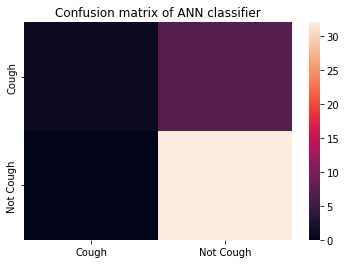

In [ ]:
ax= plt.subplot()
sns.heatmap(cm)
ax.set_title('Confusion matrix of ANN classifier')
ax.xaxis.set_ticklabels(['Cough', 'Not Cough']); ax.yaxis.set_ticklabels(['Cough', 'Not Cough']);

Although the accuracy is 82%, the confusion matrix does not show good results. This should improve when we perform over sampling on the data

**Basic Sequential Model CNN (with 1 convolutional layer and 3 dense layers and imbalanced dataset)**

In [ ]:
from tensorflow.keras.layers import Flatten, Dense, Conv1D, MaxPool1D, Dropout

In [ ]:
print("X Train shape: ", X_train.shape)
print("X Test shape: ", X_test.shape)

X Train shape:  (160, 20)
X Test shape:  (40, 20)


In [ ]:
print("y Train shape: ", y_train.shape)
print("y Test shape: ", y_test.shape)

y Train shape:  (160, 2)
y Test shape:  (40, 2)


In [ ]:
#Reshape train and test data 
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

In [ ]:
print("X Train shape: ", X_train.shape)
print("X Test shape: ", X_test.shape)

X Train shape:  (160, 20, 1)
X Test shape:  (40, 20, 1)


In [ ]:
model2 = Sequential()
model2.add(Conv1D(64, 2, activation="relu", input_shape=(20,1)))
model2.add(Dense(32, activation="relu"))
model2.add(MaxPooling1D())
model2.add(Flatten())
model2.add(Dense(20, activation = 'softmax'))
model2.add(tf.keras.layers.Dense(2, activation=tf.nn.sigmoid))
model2.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 19, 64)            192       
                                                                 
 dense_3 (Dense)             (None, 19, 32)            2080      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 9, 32)            0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 288)               0         
                                                                 
 dense_4 (Dense)             (None, 20)                5780      
                                                                 
 dense_5 (Dense)             (None, 2)                 42        
                                                      

In [ ]:
model2.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

In [ ]:
model2_history = model2.fit(X_train, y_train, epochs=100, batch_size = 100,validation_split=0.20)

Epoch 1/100
2/2 [==============================] - 1s 205ms/step - loss: 0.6908 - accuracy: 0.4766 - val_loss: 0.6307 - val_accuracy: 0.6250
Epoch 2/100
2/2 [==============================] - 0s 31ms/step - loss: 0.6223 - accuracy: 0.6406 - val_loss: 0.5670 - val_accuracy: 0.8750
Epoch 3/100
2/2 [==============================] - 0s 44ms/step - loss: 0.5871 - accuracy: 0.7578 - val_loss: 0.5643 - val_accuracy: 0.7812
Epoch 4/100
2/2 [==============================] - 0s 26ms/step - loss: 0.5689 - accuracy: 0.8047 - val_loss: 0.5656 - val_accuracy: 0.7812
Epoch 5/100
2/2 [==============================] - 0s 27ms/step - loss: 0.5676 - accuracy: 0.8047 - val_loss: 0.5645 - val_accuracy: 0.7812
Epoch 6/100
2/2 [==============================] - 0s 25ms/step - loss: 0.5658 - accuracy: 0.8047 - val_loss: 0.5690 - val_accuracy: 0.7812
Epoch 7/100
2/2 [==============================] - 0s 27ms/step - loss: 0.5651 - accuracy: 0.8047 - val_loss: 0.5706 - val_accuracy: 0.7812
Epoch 8/100
2/2 [==

In [ ]:
score_test2, acc_test2 = model2.evaluate(X_test, y_test,batch_size=batch_size, verbose=1)
score_train2, acc_train2 = model2.evaluate(X_train, y_train,batch_size=batch_size, verbose=1)

2/2 [==============================] - 0s 6ms/step - loss: 0.4951 - accuracy: 0.8375


In [ ]:
print("Test Accuracy:", acc_test2)
print("Train Accuracy:", acc_train2)

Test Accuracy: 0.824999988079071
Train Accuracy: 0.8374999761581421


In [ ]:
#Confusion Matrix
y_pred2 = model2.predict(X_test)
y_test_class2 = np.argmax(y_test, axis=1)
y_pred_class2 = np.argmax(y_pred2, axis=1)
cm2=confusion_matrix(y_test_class2, y_pred_class2)
cm2

array([[ 1,  7],
       [ 0, 32]])

**Applying Oversampling for the imbalanced data**

In [ ]:
!pip install imbalanced-learn

In [ ]:
# check version number
import imblearn
print(imblearn.__version__)

0.8.1


In [ ]:
# define oversampling strategy
from imblearn.over_sampling import RandomOverSampler
oversample = RandomOverSampler(sampling_strategy='minority')

In [ ]:
# fit and apply the transform
X_over, y_over = oversample.fit_resample(X, y)

In [ ]:
print(X_over.shape)
print(y_over.shape)

(320, 20)
(320,)


In [ ]:
y_2=np.array(pd.get_dummies(y_over))

In [ ]:
print(y_2.shape)

(320, 2)


In [ ]:
# Splitting the oversampled data
X_train_os,X_test_os,y_train_os,y_test_os=train_test_split(X_over,y_2,test_size=0.20,random_state=42)

In [ ]:
print(X_train_os.shape)
print(X_test_os.shape)
print(y_train_os.shape)
print(y_test_os.shape)

(256, 20)
(64, 20)
(256, 2)
(64, 2)


**Applying ANN model on the oversampled data**

In [ ]:
### No of classes
model3 = Sequential()
# First Layer
model3.add(Dense(60, input_shape = (20,), activation = "relu"))
# Second Layer
model3.add(Dense(15, activation = "relu"))
model3.add(Dropout(0.2))
# Final Layer
model3.add(Dense(2, activation = "softmax"))
model3.compile(loss='binary_crossentropy', optimizer='adam',metrics=['accuracy'])
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 60)                1260      
                                                                 
 dense_7 (Dense)             (None, 15)                915       
                                                                 
 dropout_1 (Dropout)         (None, 15)                0         
                                                                 
 dense_8 (Dense)             (None, 2)                 32        
                                                                 
Total params: 2,207
Trainable params: 2,207
Non-trainable params: 0
_________________________________________________________________


In [ ]:
batch_size=100
model3_history=model3.fit(X_train_os, y_train_os,batch_size=batch_size,verbose=1, epochs=100, validation_split=0.20)

Epoch 1/100
3/3 [==============================] - 1s 93ms/step - loss: 9.6560 - accuracy: 0.5196 - val_loss: 1.7116 - val_accuracy: 0.6346
Epoch 2/100
3/3 [==============================] - 0s 23ms/step - loss: 7.9223 - accuracy: 0.6029 - val_loss: 1.7026 - val_accuracy: 0.6923
Epoch 3/100
3/3 [==============================] - 0s 22ms/step - loss: 8.1896 - accuracy: 0.5784 - val_loss: 1.6104 - val_accuracy: 0.7115
Epoch 4/100
3/3 [==============================] - 0s 21ms/step - loss: 6.6035 - accuracy: 0.6078 - val_loss: 1.6242 - val_accuracy: 0.7500
Epoch 5/100
3/3 [==============================] - 0s 21ms/step - loss: 7.7230 - accuracy: 0.5882 - val_loss: 1.8652 - val_accuracy: 0.7500
Epoch 6/100
3/3 [==============================] - 0s 22ms/step - loss: 5.9342 - accuracy: 0.6716 - val_loss: 2.4274 - val_accuracy: 0.7115
Epoch 7/100
3/3 [==============================] - 0s 20ms/step - loss: 4.3380 - accuracy: 0.7304 - val_loss: 2.3638 - val_accuracy: 0.7115
Epoch 8/100
3/3 [===

In [ ]:
score_test3, acc_test3 = model3.evaluate(X_test_os, y_test_os,batch_size=batch_size, verbose=1)
score_train3, acc_train3 = model3.evaluate(X_train_os, y_train_os,batch_size=batch_size, verbose=1)
print("Test Accuracy:", acc_test3)
print("Train Accuracy:", acc_train3)


3/3 [==============================] - 0s 3ms/step - loss: 0.3728 - accuracy: 0.8242
Test Accuracy: 0.796875
Train Accuracy: 0.82421875


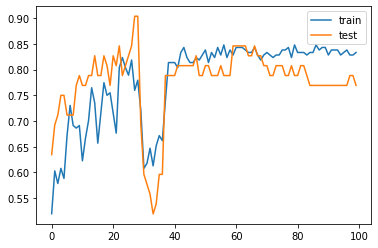

In [ ]:
# plot training history
plt.plot(model3_history.history['accuracy'], label='train')
plt.plot(model3_history.history['val_accuracy'], label='test')
plt.legend()
plt.show()

In [ ]:
#y_pred_class = model.predict_classes(X_test)
from sklearn.metrics import confusion_matrix
y_pred_ann = model3.predict(X_test_os)
y_test_class_ann = np.argmax(y_test_os, axis=1)
y_pred_class_ann = np.argmax(y_pred_ann, axis=1)
cm3=confusion_matrix(y_test_class_ann, y_pred_class_ann)
cm3

array([[30,  0],
       [13, 21]])

[Text(0, 0.5, 'Cough'), Text(0, 1.5, 'Not Cough')]

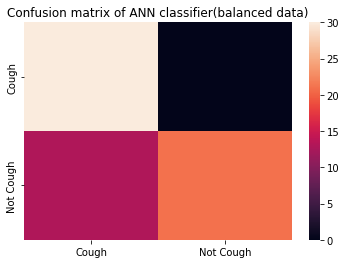

In [ ]:
ax= plt.subplot()
sns.heatmap(cm3)
ax.set_title('Confusion matrix of ANN classifier(balanced data)')
ax.xaxis.set_ticklabels(['Cough', 'Not Cough']); ax.yaxis.set_ticklabels(['Cough', 'Not Cough'])

**Basic Sequential Model CNN (with 1 convolutional layer and 3 dense layers and balanced dataset)**

In [ ]:
#Reshape train and test data 
X_train_rs = np.array(X_train_os).reshape(X_train_os.shape[0], X_train_os.shape[1], 1)
X_test_rs = np.array(X_test_os).reshape(X_test_os.shape[0], X_test_os.shape[1], 1)

In [ ]:
print("X Train re-shaped: ", X_train_rs.shape)
print("X Test re-shaped: ", X_test_rs.shape)

X Train re-shaped:  (256, 20, 1)
X Test re-shaped:  (64, 20, 1)


In [ ]:
model4 = Sequential()
model4.add(Conv1D(64, 2, activation="relu", input_shape=(20,1)))
model4.add(Dense(32, activation="relu"))
model4.add(MaxPooling1D())
model4.add(Flatten())
model4.add(Dense(20, activation = 'softmax'))
model4.add(tf.keras.layers.Dense(2, activation=tf.nn.sigmoid))
model4.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 19, 64)            192       
                                                                 
 dense_9 (Dense)             (None, 19, 32)            2080      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 9, 32)            0         
 1D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 288)               0         
                                                                 
 dense_10 (Dense)            (None, 20)                5780      
                                                                 
 dense_11 (Dense)            (None, 2)                 42        
                                                      

In [ ]:
model4.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

model4_history = model4.fit(X_train_rs, y_train_os, epochs=50, batch_size = 100,validation_split=0.25)

Epoch 1/50
2/2 [==============================] - 1s 207ms/step - loss: 0.3109 - accuracy: 0.9427 - val_loss: 0.2675 - val_accuracy: 0.9844
Epoch 2/50
2/2 [==============================] - 0s 29ms/step - loss: 0.2810 - accuracy: 0.9740 - val_loss: 0.3053 - val_accuracy: 0.9531
Epoch 3/50
2/2 [==============================] - 0s 28ms/step - loss: 0.3109 - accuracy: 0.9375 - val_loss: 0.2986 - val_accuracy: 0.9531
Epoch 4/50
2/2 [==============================] - 0s 29ms/step - loss: 0.2952 - accuracy: 0.9531 - val_loss: 0.2657 - val_accuracy: 0.9844
Epoch 5/50
2/2 [==============================] - 0s 31ms/step - loss: 0.2725 - accuracy: 0.9792 - val_loss: 0.2871 - val_accuracy: 0.9531
Epoch 6/50
2/2 [==============================] - 0s 28ms/step - loss: 0.2871 - accuracy: 0.9635 - val_loss: 0.2909 - val_accuracy: 0.9531
Epoch 7/50
2/2 [==============================] - 0s 30ms/step - loss: 0.2808 - accuracy: 0.9688 - val_loss: 0.2683 - val_accuracy: 0.9844
Epoch 8/50
2/2 [==========

In [ ]:
score_test4, acc_test4 = model4.evaluate(X_test_rs, y_test_os)
score_train4, acc_train4 = model4.evaluate(X_train_rs, y_train_os)
print("Test Accuracy:", acc_test4)
print("Train Accuracy:", acc_train4)

8/8 [==============================] - 0s 3ms/step - loss: 0.2509 - accuracy: 0.9805
Test Accuracy: 0.90625
Train Accuracy: 0.98046875


In [ ]:
#Confusion Matrix
y_pred_cnn = model4.predict(X_test_rs)
y_test_class_cnn = np.argmax(y_test_os, axis=1)
y_pred_class_cnn = np.argmax(y_pred_cnn, axis=1)
cm4=confusion_matrix(y_test_class_cnn, y_pred_class_cnn)
cm4


array([[29,  1],
       [ 5, 29]])

[Text(0, 0.5, 'Cough'), Text(0, 1.5, 'Not Cough')]

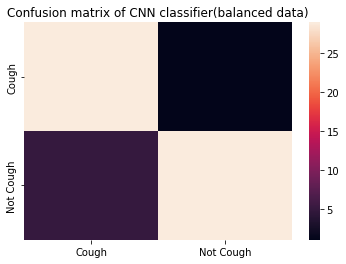

In [ ]:
ax= plt.subplot()
sns.heatmap(cm4)
ax.set_title('Confusion matrix of CNN classifier(balanced data)')
ax.xaxis.set_ticklabels(['Cough', 'Not Cough']); ax.yaxis.set_ticklabels(['Cough', 'Not Cough'])

8/8 [==============================] - 0s 3ms/step - loss: 0.2509 - accuracy: 0.9805
Test Accuracy: 0.90625
Train Accuracy: 0.98046875


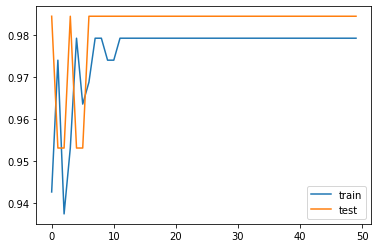

In [ ]:
# evaluate the model
score_test4, acc_test4 = model4.evaluate(X_test_rs, y_test_os)
score_train4, acc_train4 = model4.evaluate(X_train_rs, y_train_os)
print("Test Accuracy:", acc_test4)
print("Train Accuracy:", acc_train4)
# plot training history
plt.plot(model4_history.history['accuracy'], label='train')
plt.plot(model4_history.history['val_accuracy'], label='test')
plt.legend()
plt.show()

Conclusion

This turned out to be a pretty decent classifier for our dataset considering the relatively larger number of true positive and true negative values and an accuracy of 90 %

**Basic Sequential CNN Model : with 3 convolutional layer and 3 dense layers**

In [ ]:
model5 = tf.keras.models.Sequential()
#First CNN convolution layer  with 32 filters
model5.add(Conv1D(filters=32, kernel_size=(3,), padding='same', activation=tf.keras.layers.LeakyReLU(alpha=0.001), input_shape = (X_train.shape[1],1)))
#Second CNN convolution layer  with 64 filters
model5.add(Conv1D(filters=64, kernel_size=(3,), padding='same', activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
#Third CNN convolution layer with 128 filters
model5.add(Conv1D(filters=128, kernel_size=(3,), padding='same', activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
#Fourth CNN layer with Max pooling
model5.add(MaxPool1D(pool_size=(3,), strides=2, padding='same'))
# Drop out layer
model5.add(Dropout(0.5))
#Flatten the output
model5.add(Flatten())
#Add a dense layer with 256 neurons
model5.add(Dense(units = 256, activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
#Add a dense layer with 512 neurons
model5.add(Dense(units = 512, activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
#Softmax as last layer with 2 outputs
model5.add(Dense(units = 2, activation='softmax'))

In [ ]:
model5.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
acc = model5.evaluate(X_train_rs, y_train_os)
print("Loss:", acc[0], " Accuracy:", acc[1])

8/8 [==============================] - 0s 6ms/step - loss: 1.9724 - accuracy: 0.4062
Loss: 1.9724420309066772  Accuracy: 0.40625


In [ ]:
model5_history = model5.fit(X_train_rs, y_train_os, epochs=100, batch_size = 100, validation_split=0.20)

Epoch 1/100
3/3 [==============================] - 0s 62ms/step - loss: 2.4039e-04 - accuracy: 1.0000 - val_loss: 0.4228 - val_accuracy: 0.9423
Epoch 2/100
3/3 [==============================] - 0s 36ms/step - loss: 8.9643e-04 - accuracy: 1.0000 - val_loss: 0.4437 - val_accuracy: 0.9423
Epoch 3/100
3/3 [==============================] - 0s 38ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.4257 - val_accuracy: 0.9423
Epoch 4/100
3/3 [==============================] - 0s 41ms/step - loss: 3.3651e-04 - accuracy: 1.0000 - val_loss: 0.4019 - val_accuracy: 0.9423
Epoch 5/100
3/3 [==============================] - 0s 37ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.3434 - val_accuracy: 0.9423
Epoch 6/100
3/3 [==============================] - 0s 36ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.3023 - val_accuracy: 0.9423
Epoch 7/100
3/3 [==============================] - 0s 38ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.2997 - val_accuracy: 0.9423
Epoch 8/

In [ ]:
score_test5, acc_test5 = model5.evaluate(X_test_rs, y_test_os)
score_train5, acc_train5 = model5.evaluate(X_train_rs, y_train_os)
print("Test Accuracy:", acc_test5)
print("Train Accuracy:", acc_train5)

8/8 [==============================] - 0s 6ms/step - loss: 0.0707 - accuracy: 0.9883
Test Accuracy: 0.984375
Train Accuracy: 0.98828125


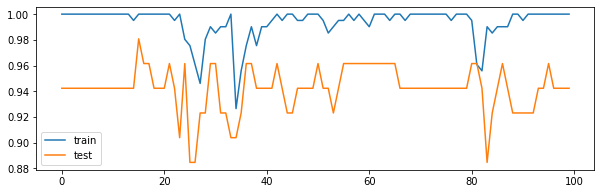

In [ ]:
# plot training history
plt.figure(figsize=(10, 3))
plt.plot(model5_history.history['accuracy'], label='train')
plt.plot(model5_history.history['val_accuracy'], label='test')
plt.legend()
plt.show()

In [ ]:
#Confusion Matrix
y_pred_cnn2 = model5.predict(X_test_rs)
y_test_class_cnn2 = np.argmax(y_test_os, axis=1)
y_pred_class_cnn2 = np.argmax(y_pred_cnn2, axis=1)
cm5=confusion_matrix(y_test_class_cnn2, y_pred_class_cnn2)
cm5

array([[30,  0],
       [ 1, 33]])

[Text(0, 0.5, 'Cough'), Text(0, 1.5, 'Not Cough')]

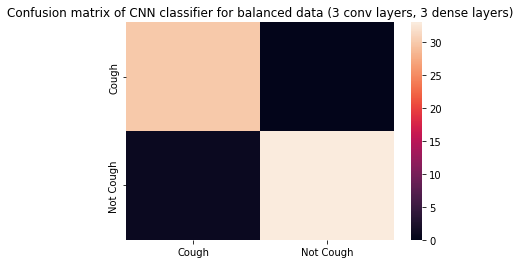

In [ ]:
ax= plt.subplot()
sns.heatmap(cm5)
ax.set_title('Confusion matrix of CNN classifier for balanced data (3 conv layers, 3 dense layers)')
ax.xaxis.set_ticklabels(['Cough', 'Not Cough']); ax.yaxis.set_ticklabels(['Cough', 'Not Cough'])

Conclusion

The CNN with 3 Convolution layers and 3 dense layers has a very good accuracy of 98% and the Confusion matrix also looks good compared to the previous models.

**Obtaining Spectrograms for all the wav files (Cough, non-cough)**

The same audio data used for the above analysis have all been converted into the corresponding spectrograms and then split into Train and test data and uploaded into the Teachable machine.


In [ ]:
from scipy.io import wavfile
Cough_list = []
path = "/content/drive/MyDrive/ESC-50-master/Final-samples-for teachable/human_cough"
files = os.listdir(path)

for fl in glob.glob(os.path.join(path, '*-24.wav')):
    samplerate, data = wavfile.read(fl)
    Cough_list.append(fl)

In [ ]:
Cough_list
print(len(Cough_list))

40


In [ ]:
def convert_audio_to_spectogram_log(file_name1):

    x, sr = librosa.load(file_name1, sr=44100)
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    fig=plt.figure(figsize=(10, 3))
    librosa.display.specshow(Xdb, sr = sr, x_axis = 'time', y_axis = 'log')
    plt.title(file_name1)
    plt.colorbar() 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


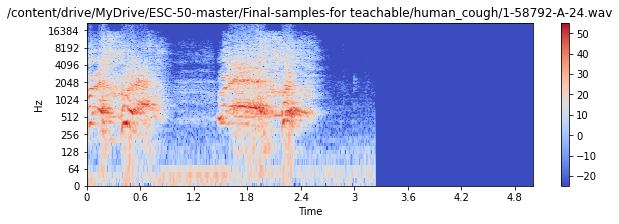

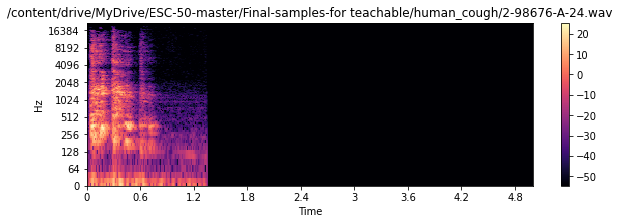

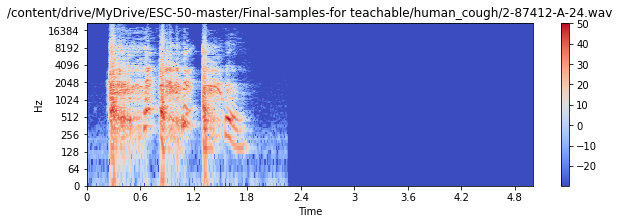

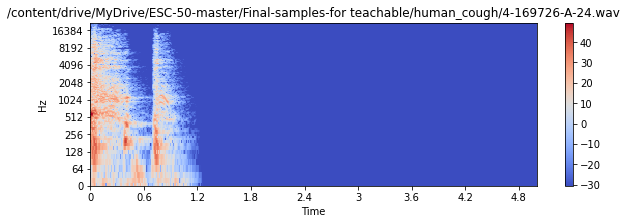

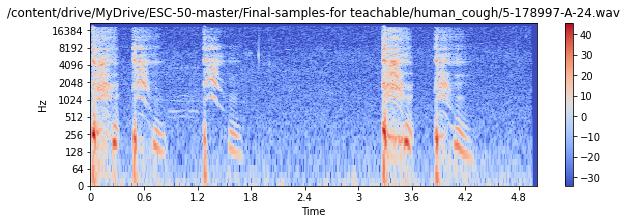

...

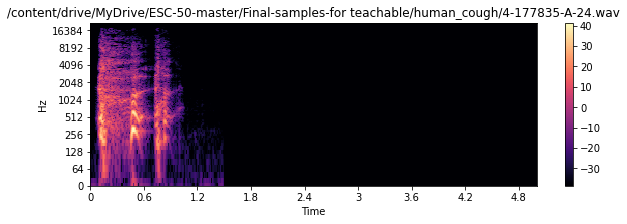

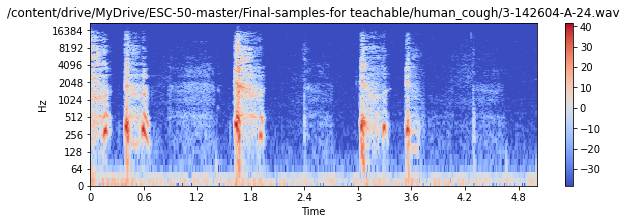

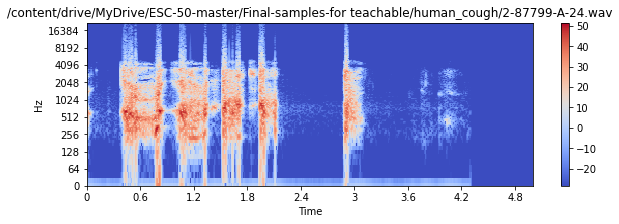

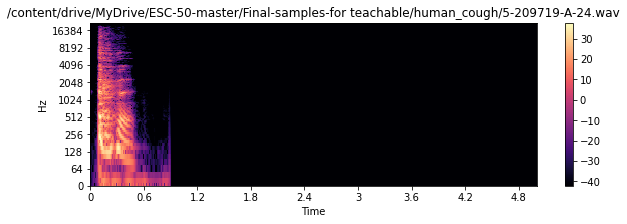

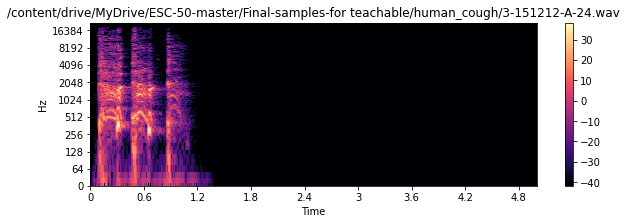

In [ ]:
for row in (Cough_list):
    file_name1 = os.path.join(os.path.abspath(row))
    viz=convert_audio_to_spectogram_log(file_name1)

In [ ]:
# Non cough files
from scipy.io import wavfile
Non_Cough_list = []
path1 = "/content/drive/MyDrive/ESC-50-master/Final-samples-for teachable/Not Cough"
files = os.listdir(path)

for f2 in glob.glob(os.path.join(path1, '*.wav')):
    samplerate, data = wavfile.read(f2)
    Non_Cough_list.append(f2)

In [ ]:
len(Non_Cough_list)

40

In [ ]:
# Spectrogram for non cough files
def convert_audio_to_spectogram_non_cough(file_name3):

    x1, sr1 = librosa.load(file_name3, sr=44100)
    X1 = librosa.stft(x1)
    Xdb1 = librosa.amplitude_to_db(abs(X1))
    fig4=plt.figure(figsize=(10, 3))
    librosa.display.specshow(Xdb1, sr = sr1, x_axis = 'time', y_axis = 'log')
    plt.title(file_name3)
    plt.colorbar() 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


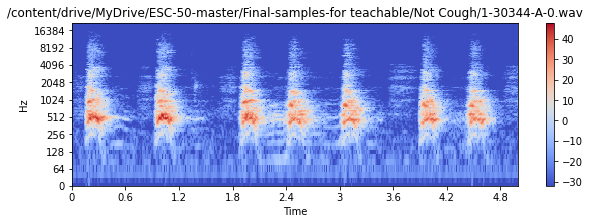

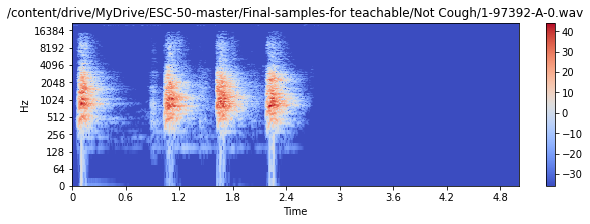

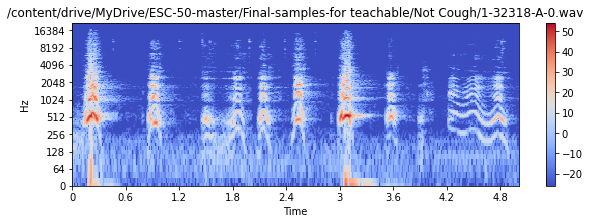

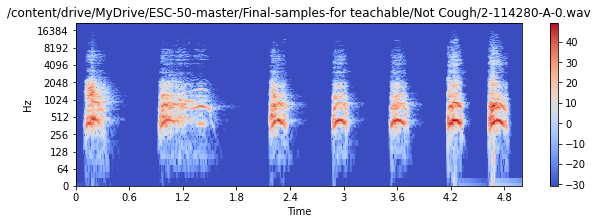

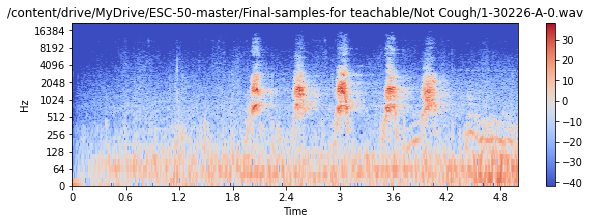

...

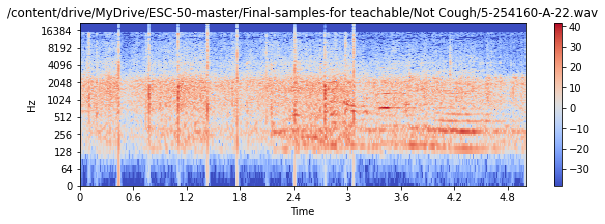

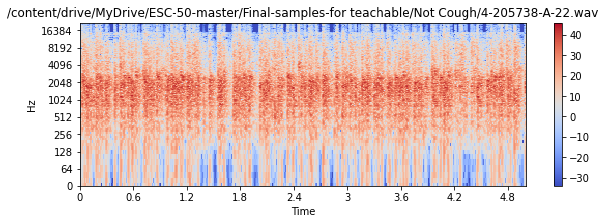

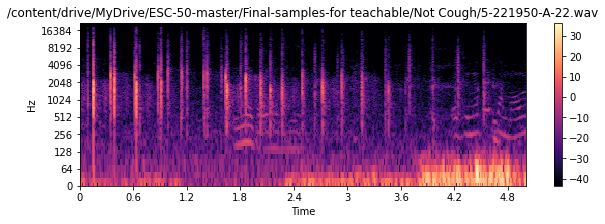

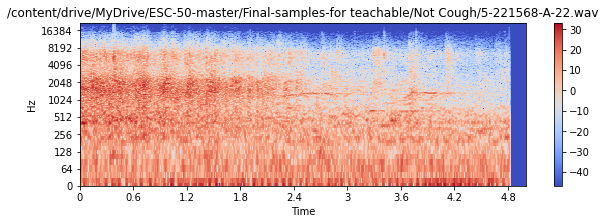

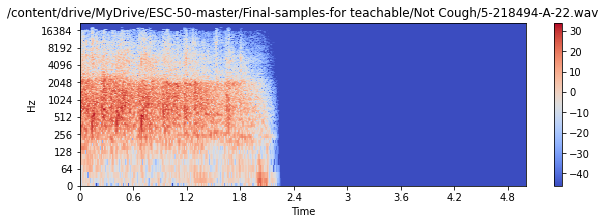

In [ ]:
for row in (Non_Cough_list):
    file_name3 = os.path.join(os.path.abspath(row))
    viz4=convert_audio_to_spectogram_non_cough(file_name3)

**Screenshots of the results from the Teachable Machine**

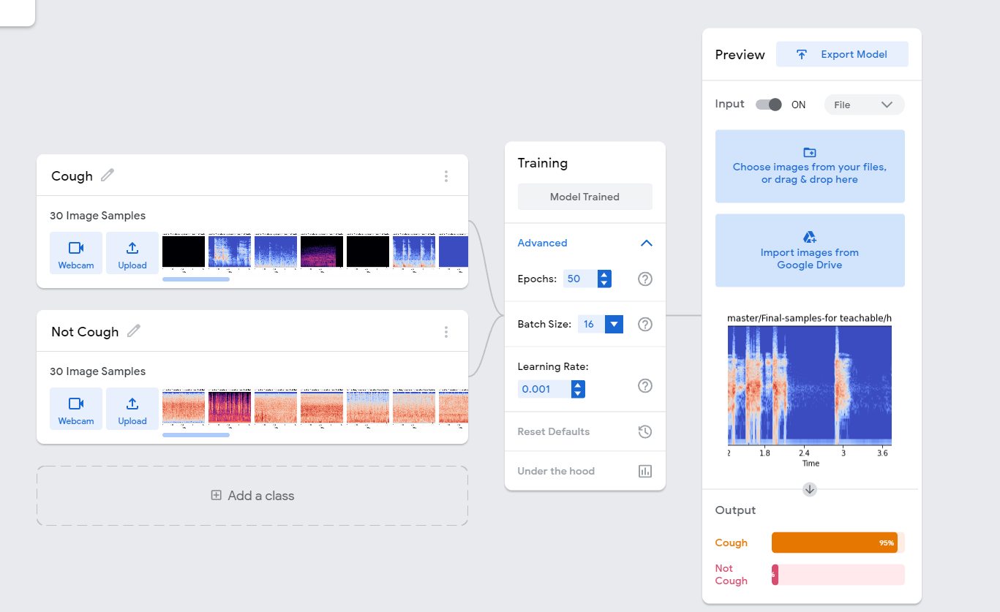

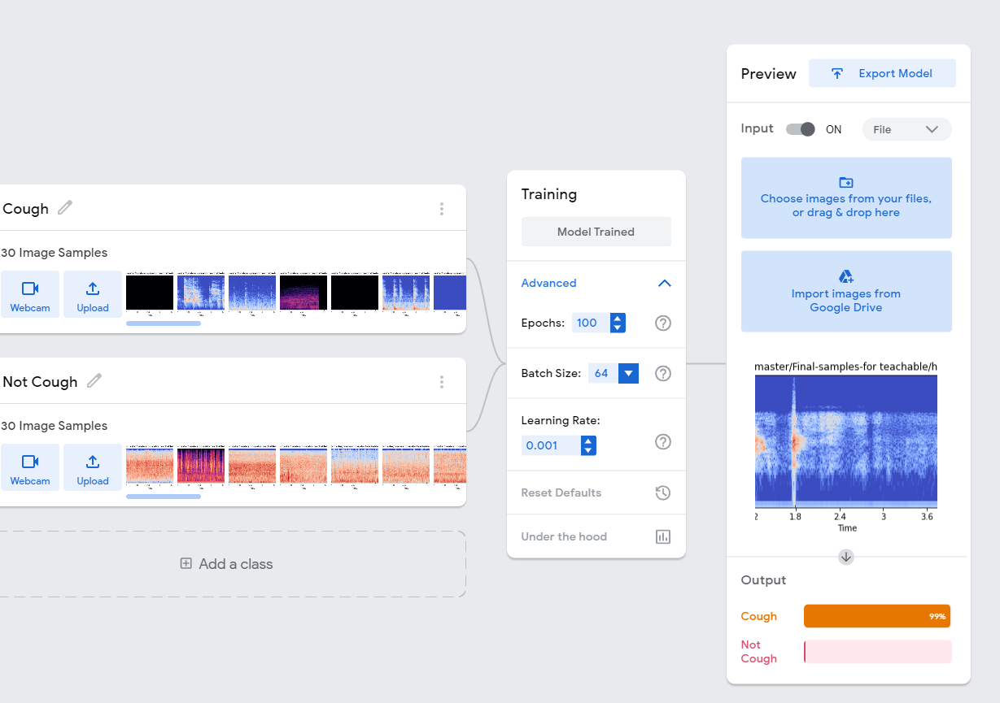

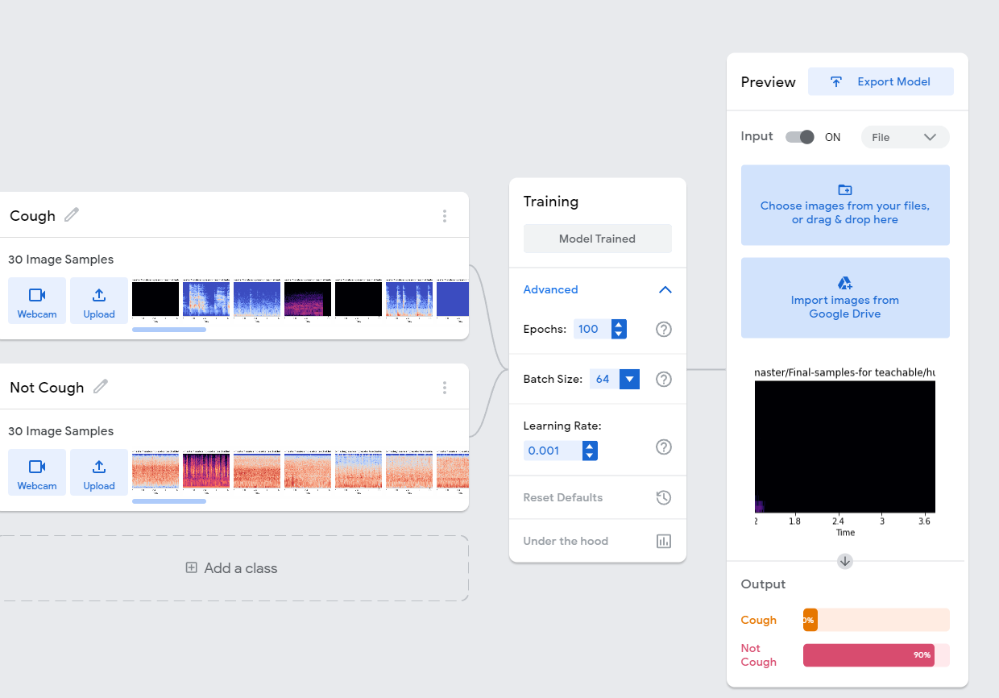

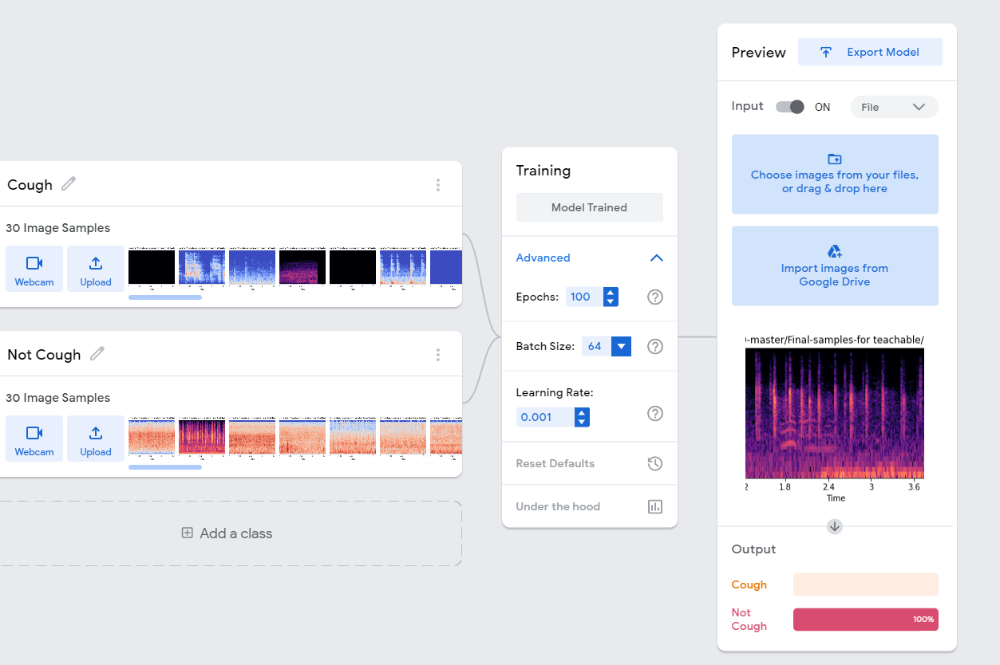